# TBD


## consider before continuing
The data below is not for everyone, therefore ...  
for those of you with a closed mind please consider to NOT continuing.

for the rest of you, i hope that you find that   
**Knowledge is the greatest gift**


## Setup


In [67]:
import os
import re
import math

import numpy as np
import pandas as pd

# from multiprocessing import Pool
from IPython.display import display, HTML, FileLink

# **not needed - using Text only**
# # Graphs and Charts
# import plotly
import plotly.express as px
# from matplotlib import pyplot as plt 
# from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio

# from bokeh.plotting import figure, show
# import altair as alt
# import matplotlib as mpl
import scipy 

# import random


# pandas Settings/Options
pd.set_option("display.max_rows", None) 
pd.set_option("display.max_columns", None)
pd.set_option('display.width', 9000)
pd.set_option('max_colwidth', 400)

DIR = os.getcwd()
print(f'{DIR=}')

DIR='c:\\Users\\JGarza\\GitHub\\Excess_Mortality_And_Vaccines_In_Europe'


## Helping Functions

In [68]:
def df_column_uniquify(df):
    '''
    renames columns that are the same
    '''
    df_columns = df.columns
    new_columns = []
    for item in df_columns:
        counter = 0
        newitem = item
        while newitem in new_columns:
            counter += 1
            newitem = "{}_{}".format(item, counter)
        new_columns.append(newitem)
    df.columns = new_columns
    return df

In [69]:
country_dict = {
    "BE": "Belgium",
    "BG": "Bulgaria",
    "CZ": "Czechia",
    "DK": "Denmark",
    "DE": "Germany",
    "EE": "Estonia",
    "IE": "Ireland",
    "EL": "Greece",
    "ES": "Spain",
    "FR": "France",
    "HR": "Croatia",
    "IT": "Italy",
    "CY": "Cyprus",
    "LV": "Latvia",
    "LT": "Lithuania",
    "LU": "Luxembourg",
    "HU": "Hungary",
    "MT": "Malta",
    "NL": "Netherlands",
    "AT": "Austria",
    "PL": "Poland",
    "PT": "Portugal",
    "RO": "Romania",
    "SI": "Slovenia",
    "SK": "Slovakia",
    "FI": "Finland",
    "SE": "Sweden",
    "IS": "Iceland",
    "LI": "Liechtenstein",
    "NO": "Norway",
    "CH": "Switzerland",
    "UK": "United Kingdom",
    "ME": "Montenegro",
    "GE": "Georgia",
    "AL": "Albania",
    "RS": "Serbia",
    "AD": "Andorra",
    "AM": "Armenia"
}

def abbr_to_name(abbreviation):
    return country_dict.get(abbreviation.upper(), "Abbreviation not found")

def name_to_abbr(name):
    reverse_dict = {v: k for k, v in country_dict.items()}
    return reverse_dict.get(name.title(), "Country name not found")

print( abbr_to_name("BE") )  # Output: 'Belgium'
print( name_to_abbr("Belgium") )  # Output: 'BE'

Belgium
BE


## DataSet1 **ds1**

### Data Source
https://ec.europa.eu/

#### How to Download
1. go to [here](https://ec.europa.eu/eurostat/databrowser/view/demo_r_mwk_ts__custom_14738200/default/table?lang=en)
2. Click download, and pick the spreadsheet format, and click download again

### Description
Count of deaths in European countries between 2015-2024(week ~47)



### Import and Clean Data

In [70]:
ds1 = pd.read_excel(os.path.join(DIR,"demo_r_mwk_ts__custom_14738200_page_spreadsheet.xlsx"),sheet_name = "Sheet 1")

c:\Users\JGarza\pythons\Python312\Lib\site-packages\openpyxl\styles\stylesheet.py:237: UserWarning:

Workbook contains no default style, apply openpyxl's default



In [71]:
# remove the headers
ds1 = ds1.iloc[7:47]

# drop the bad columns
for c in ds1.columns:
    if pd.isnull(ds1.at[7,c]):
        ds1 = ds1.drop(columns=[c])

# rename time columns
for c in ds1.columns:
    name = ds1.at[7,c]
    ds1 = ds1.rename(columns={c: name})

# make the duplicate column names unique
ds1 = df_column_uniquify(ds1)

# # rename the first two columns
ds1 = ds1.rename(columns={'TIME': 'abbr'})
ds1 = ds1.rename(columns={'TIME_1':'name'})
           
# drop, replace, reset index,
ds1 = ds1.drop([7,8,9])
ds1 = ds1.replace(to_replace=':', value=None)
ds1 = ds1.reset_index(drop=True)


display(ds1)

,abbr,name,2015-W01,2015-W02,2015-W03,2015-W04,2015-W05,2015-W06,2015-W07,2015-W08,2015-W09,2015-W10,2015-W11,2015-W12,2015-W13,2015-W14,2015-W15,2015-W16,2015-W17,2015-W18,2015-W19,2015-W20,2015-W21,2015-W22,2015-W23,2015-W24,2015-W25,2015-W26,2015-W27,2015-W28,2015-W29,2015-W30,2015-W31,2015-W32,2015-W33,2015-W34,2015-W35,2015-W36,2015-W37,2015-W38,2015-W39,2015-W40,2015-W41,2015-W42,2015-W43,2015-W44,2015-W45,2015-W46,2015-W47,2015-W48,2015-W49,2015-W50,2015-W51,2015-W52,2015-W53,2016-W01,2016-W02,2016-W03,2016-W04,2016-W05,2016-W06,2016-W07,2016-W08,2016-W09,2016-W10,2016-W11,2016-W12,2016-W13,2016-W14,2016-W15,2016-W16,2016-W17,2016-W18,2016-W19,2016-W20,2016-W21,2016-W22,2016-W23,2016-W24,2016-W25,2016-W26,2016-W27,2016-W28,2016-W29,2016-W30,2016-W31,2016-W32,2016-W33,2016-W34,2016-W35,2016-W36,2016-W37,2016-W38,2016-W39,2016-W40,2016-W41,2016-W42,2016-W43,2016-W44,2016-W45,2016-W46,2016-W47,2016-W48,2016-W49,2016-W50,2016-W51,2016-W52,2017-W01,2017-W02,2017-W03,2017-W04,2017-W05,2017-W06,2017-W07,2017-W08,2017-W09,2017-W10,2017-W11,2017-W12,2017-W13,2017-W14,2017-W15,2017-W16,2017-W17,2017-W18,2017-W19,2017-W20,2017-W21,2017-W22,2017-W23,2017-W24,2017-W25,2017-W26,2017-W27,2017-W28,2017-W29,2017-W30,2017-W31,2017-W32,2017-W33,2017-W34,2017-W35,2017-W36,2017-W37,2017-W38,2017-W39,2017-W40,2017-W41,2017-W42,2017-W43,2017-W44,2017-W45,2017-W46,2017-W47,2017-W48,2017-W49,2017-W50,2017-W51,2017-W52,2018-W01,2018-W02,2018-W03,2018-W04,2018-W05,2018-W06,2018-W07,2018-W08,2018-W09,2018-W10,2018-W11,2018-W12,2018-W13,2018-W14,2018-W15,2018-W16,2018-W17,2018-W18,2018-W19,2018-W20,2018-W21,2018-W22,2018-W23,2018-W24,2018-W25,2018-W26,2018-W27,2018-W28,2018-W29,2018-W30,2018-W31,2018-W32,2018-W33,2018-W34,2018-W35,2018-W36,2018-W37,2018-W38,2018-W39,2018-W40,2018-W41,2018-W42,2018-W43,2018-W44,2018-W45,2018-W46,2018-W47,2018-W48,2018-W49,2018-W50,2018-W51,2018-W52,2019-W01,2019-W02,2019-W03,2019-W04,2019-W05,2019-W06,2019-W07,2019-W08,2019-W09,2019-W10,2019-W11,2019-W12,2019-W13,2019-W14,2019-W15,2019-W16,2019-W17,2019-W18,2019-W19,2019-W20,2019-W21,2019-W22,2019-W23,2019-W24,2019-W25,2019-W26,2019-W27,2019-W28,2019-W29,2019-W30,2019-W31,2019-W32,2019-W33,2019-W34,2019-W35,2019-W36,2019-W37,2019-W38,2019-W39,2019-W40,2019-W41,2019-W42,2019-W43,2019-W44,2019-W45,2019-W46,2019-W47,2019-W48,2019-W49,2019-W50,2019-W51,2019-W52,2020-W01,2020-W02,2020-W03,2020-W04,2020-W05,2020-W06,2020-W07,2020-W08,2020-W09,2020-W10,2020-W11,2020-W12,2020-W13,2020-W14,2020-W15,2020-W16,2020-W17,2020-W18,2020-W19,2020-W20,2020-W21,2020-W22,2020-W23,2020-W24,2020-W25,2020-W26,2020-W27,2020-W28,2020-W29,2020-W30,2020-W31,2020-W32,2020-W33,2020-W34,2020-W35,2020-W36,2020-W37,2020-W38,2020-W39,2020-W40,2020-W41,2020-W42,2020-W43,2020-W44,2020-W45,2020-W46,2020-W47,2020-W48,2020-W49,2020-W50,2020-W51,2020-W52,2020-W53,2021-W01,2021-W02,2021-W03,2021-W04,2021-W05,2021-W06,2021-W07,2021-W08,2021-W09,2021-W10,2021-W11,2021-W12,2021-W13,2021-W14,2021-W15,2021-W16,2021-W17,2021-W18,2021-W19,2021-W20,2021-W21,2021-W22,2021-W23,2021-W24,2021-W25,2021-W26,2021-W27,2021-W28,2021-W29,2021-W30,2021-W31,2021-W32,2021-W33,2021-W34,2021-W35,2021-W36,2021-W37,2021-W38,2021-W39,2021-W40,2021-W41,2021-W42,2021-W43,2021-W44,2021-W45,2021-W46,2021-W47,2021-W48,2021-W49,2021-W50,2021-W51,2021-W52,2022-W01,2022-W02,2022-W03,2022-W04,2022-W05,2022-W06,2022-W07,2022-W08,2022-W09,2022-W10,2022-W11,2022-W12,2022-W13,2022-W14,2022-W15,2022-W16,2022-W17,2022-W18,2022-W19,2022-W20,2022-W21,2022-W22,2022-W23,2022-W24,2022-W25,2022-W26,2022-W27,2022-W28,2022-W29,2022-W30,2022-W31,2022-W32,2022-W33,2022-W34,2022-W35,2022-W36,2022-W37,2022-W38,2022-W39,2022-W40,2022-W41,2022-W42,2022-W43,2022-W44,2022-W45,2022-W46,2022-W47,2022-W48,2022-W49,2022-W50,2022-W51,2022-W52,2023-W01,2023-W02,2023-W03,2023-W04,2023-W05,2023-W06,2023-W07,2023-W08,2023-W09,2023-W10,2023-W11,2023-W12,2023-W13,2023-W14,2023-W15,2023-W16,2023-W17,2023-W18,2023-W19,2023-W20,2023-W21,2023-W22,2023-W23,2023-W24,2023-W25,20

In [72]:
## More Cleaning

yw_cols = ds1.columns[2::]
# print(yw_cols)
abbrs = ds1.abbr.drop_duplicates().to_list()
names = ds1.name.drop_duplicates().to_list()
# print(countries)
d = []

for ic,c in enumerate(abbrs):
    for yw in yw_cols:
        y = yw[0:4]
        w = yw[6:8]
        dv = ds1.at[ic,yw]
            
        d.append(
            {
                'name': names[ic],
                'abbr':c,
                'year':y,
                'week':w,
                'year.week': int(y) + int(w)/100,
                'year.p': int(y) + (int(w)/52),
                'deaths': dv
            }
        )

#print(d)
ds1 = pd.DataFrame(d)
ds1.year = pd.to_numeric(ds1.year)
ds1.week = pd.to_numeric(ds1.week)
display(ds1.head(15))
display(ds1.tail(15))



,name,abbr,year,week,year.week,year.p,deaths
0,Belgium,BE,2015,1,2015.01,2015.019231,2461.0
1,Belgium,BE,2015,2,2015.02,2015.038462,2525.0
2,Belgium,BE,2015,3,2015.03,2015.057692,2526.0
3,Belgium,BE,2015,4,2015.04,2015.076923,2510.0
4,Belgium,BE,2015,5,2015.05,2015.096154,2644.0
5,Belgium,BE,2015,6,2015.06,2015.115385,2727.0
6,Belgium,BE,2015,7,2015.07,2015.134615,2892.0
7,Belgium,BE,2015,8,2015.08,2015.153846,2774.0
8,Belgium,BE,2015,9,2015.09,2015.173077,2643.0
9,Belgium,BE,2015,10,2015.10,2015.192308,2457.0


,name,abbr,year,week,year.week,year.p,deaths
19114,Andorra,AD,2024,33,2024.33,2024.634615,NaN
19115,Andorra,AD,2024,34,2024.34,2024.653846,NaN
19116,Andorra,AD,2024,35,2024.35,2024.673077,NaN
19117,Andorra,AD,2024,36,2024.36,2024.692308,NaN
19118,Andorra,AD,2024,37,2024.37,2024.711538,NaN
19119,Andorra,AD,2024,38,2024.38,2024.730769,NaN
19120,Andorra,AD,2024,39,2024.39,2024.750000,NaN
19121,Andorra,AD,2024,40,2024.40,2024.769231,NaN
19122,Andorra,AD,2024,41,2024.41,2024.788462,NaN
19123,Andorra,AD,2024,42,2024.42,2024.807692,NaN


### Examining ds1

In [73]:

# display(HTML('<h4>Simple Line Chart</h4>'))
# fig = px.line(ds1,x='year.p',y='deaths',color='abbr',height=750)
# fig.show()

In [74]:
# display(HTML('<h4>HeatMap: <br>Mean Deaths per Week Groupped by Year.Week (2015-2025)</h4>'))

# df = pd.pivot_table(
#     data = ds1,
#     values = 'deaths',
#     index = ['abbr','name'],
#     columns=['year.week'],
#     aggfunc="sum"
# )

# display(df.style.background_gradient(cmap=sns.color_palette('Spectral_r', as_cmap=True),axis=1))

In [75]:

# display(HTML('<h4>HeatMap: <br>Mean Deaths per Week Groupped by Year (2015-2025)</h4>'))

# df = pd.pivot_table(
#     data = ds1,
#     values = 'deaths',
#     index = ['abbr','name'],
#     columns=['year'],
#     aggfunc="mean"
# )

# display(df.style.background_gradient(cmap=sns.color_palette('Spectral_r', as_cmap=True),axis=1))



## DataSet2 **ds2**
ds2 will be a cleaner version of ds1
1. remove all countries that did not report enough data
2. fill in nulls/Nan values at the end of 2024


In [76]:
ds2 = ds1.copy()

print(ds2.describe())
print(ds2.abbr.describe())

               year          week     year.week        year.p        deaths
count  19129.000000  19129.000000  19129.000000  19129.000000  18204.000000
mean    2019.448743     26.375242   2019.712495   2019.955959   2975.750989
std        2.852978     14.963609      2.852576      2.859164   4375.910501
min     2015.000000      1.000000   2015.010000   2015.019231      0.000000
25%     2017.000000     13.000000   2017.250000   2017.480769    459.000000
50%     2019.000000     26.000000   2019.500000   2019.961538   1233.500000
75%     2022.000000     39.000000   2022.220000   2022.423077   2552.000000
max     2024.000000     53.000000   2024.470000   2024.903846  28682.000000
count     19129
unique       37
top          BE
freq        517
Name: abbr, dtype: object


In [77]:
#1 

abbrs = ds2.abbr.drop_duplicates().to_list()
for ic,c in enumerate(abbrs):
    # print(ic,c)
    NACount = ds2[(ds2.abbr == c)  & (ds2.deaths.isna())].deaths.notna().count()

    if NACount > 12:
        print(f'{c} {NACount=}')
        ds2 = ds2.drop(ds2[ds2['abbr'] == c].index)




UK NACount=np.int64(205)
GE NACount=np.int64(203)
AL NACount=np.int64(166)
AD NACount=np.int64(256)


In [78]:
# 2
abbrs = ds2.abbr.drop_duplicates().to_list()
for ic,c in enumerate(abbrs):

    
    NACount = ds2[(ds2.abbr == c) & (ds2.year == 2024) & (ds2.deaths.isna())].shape[0]
    Count = ds2[(ds2.abbr == c) & (ds2.year == 2024) ].shape[0]
    MeanPerWeek = ds2[(ds2.abbr == c) & (ds2.year == 2024)].deaths.mean()
    SumFor2024 = ds2[(ds2.abbr == c) & (ds2.year == 2024)].deaths.sum()
    AvgPerWeek = SumFor2024/(Count-NACount)

    # print(c,MeanPerWeek,NACount,Count,AvgPerWeek)
    ds2.loc[(ds2.abbr == c) & (ds2.year == 2024) & (ds2.deaths.isna()),'deaths'] =  MeanPerWeek


    

In [79]:
display(ds2.head(10))

,name,abbr,year,week,year.week,year.p,deaths
0,Belgium,BE,2015,1,2015.01,2015.019231,2461.0
1,Belgium,BE,2015,2,2015.02,2015.038462,2525.0
2,Belgium,BE,2015,3,2015.03,2015.057692,2526.0
3,Belgium,BE,2015,4,2015.04,2015.076923,2510.0
4,Belgium,BE,2015,5,2015.05,2015.096154,2644.0
5,Belgium,BE,2015,6,2015.06,2015.115385,2727.0
6,Belgium,BE,2015,7,2015.07,2015.134615,2892.0
7,Belgium,BE,2015,8,2015.08,2015.153846,2774.0
8,Belgium,BE,2015,9,2015.09,2015.173077,2643.0
9,Belgium,BE,2015,10,2015.10,2015.192308,2457.0


### Examining **ds2**

In [80]:
# # simple Line Chart

# display(HTML('<h4>Simple Line Chart</h4>'))
# fig = px.line(ds2,x='year.p',y='deaths',color='abbr',height=750)
# fig.show()

In [81]:
# display(HTML('<h4>HeatMap: <br>Mean Deaths per Week Groupped by Year.Week (2015-2025)</h4>'))

# df = pd.pivot_table(
#     data = ds2,
#     values = 'deaths',
#     index = ['abbr','name'],
#     columns=['year.week'],
#     aggfunc="sum"
# )

# display(df.style.background_gradient(cmap=sns.color_palette('Spectral_r', as_cmap=True),axis=1))

In [82]:
# display(HTML('<h4>HeatMap: <br>Mean Deaths per Week Groupped by Year (2015-2025)</h4>'))

# df = pd.pivot_table(
#     data = ds2,
#     values = 'deaths',
#     index = ['abbr','name'],
#     columns=['year'],
#     aggfunc="mean"
# )

# df = df.sort_values(by='abbr')
# display(df.style.background_gradient(cmap=sns.color_palette('Spectral_r', as_cmap=True),axis=1))


## Dataset3 **ds3**
let's normalize the data ... 
ds3   = where the data is grouped by the year 
ds3p = where the data is still on a week basis

In [83]:
ds3 = pd.pivot_table(
    data = ds2,
    values = 'deaths',
    index = ['abbr','name'],
    columns=['year'],
    aggfunc="mean"
)
ds3 = ds3.reset_index()
ds3.columns.name = 'index' 


ds3p = pd.pivot_table(
    data = ds2,
    values = 'deaths',
    index = ['abbr','name'],
    columns=['year.p'],
)
ds3p = ds3p.reset_index()
ds3p.columns.name = 'index' 



In [84]:
# display(ds3)

In [85]:
# display(ds3p)

In [86]:
ds3['baseline'] = 0.0

abbrs = ds3.abbr.drop_duplicates().to_list()
for ic,c in enumerate(abbrs):
    # print(ic,c)
    baseline = ds3[(ds3.abbr == c)][[2015,2016,2017]].values.mean()

    ds3.loc[(ds3.abbr == c),'baseline'] = baseline


for y in range(2015,2025):
    # print(y)
    ds3[y] /= ds3['baseline']

# new baseline
ds3['baseline'] = 1.0

ds3 = ds3.reset_index(drop=True)
ds3.columns.name = 'index'

# display(ds3)


In [87]:

ds3p['baseline'] = 0.0

cols = ds3p.columns
# print(cols[2:159]) # ( 52 * 3 ) + 3

abbrs = ds3p.abbr.drop_duplicates().to_list()
for ic,c in enumerate(abbrs):
    # print(ic,c)
    baseline = ds3p[(ds3p.abbr == c)][cols[3:159]].values.mean()

    ds3p.loc[(ds3.abbr == c),'baseline'] = baseline

# print(cols[2::])
for y in cols[2::]:
    # print(y,ds3yw[y])
    ds3p[y] /= ds3p['baseline']   

# new baseline
ds3p['baseline'] = 1.0

# display(ds3p)

In [88]:
display(ds3.head(10))
display(ds3p.head(10))

index,abbr,name,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,baseline
0,AT,Austria,1.010987,0.979174,1.009838,1.019178,1.012893,1.111234,1.112013,1.137336,1.088789,1.067498,1.0
1,BE,Belgium,1.011514,0.986236,1.002250,1.011999,0.994527,1.155697,1.026811,1.065167,1.019557,1.010718,1.0
2,BG,Bulgaria,1.011203,0.983878,1.004919,0.994670,0.991085,1.135620,1.366449,1.087036,0.925294,0.904618,1.0
3,CH,Switzerland,1.018227,0.975392,1.006381,1.009172,1.018632,1.122957,1.065162,1.117908,1.076161,1.044423,1.0
4,CY,Cyprus,1.016346,0.943262,1.040393,1.003860,1.076579,1.129651,1.249891,1.247986,1.157954,1.096045,1.0
5,CZ,Czechia,1.011641,0.977006,1.011353,1.025903,1.020764,1.175400,1.267756,1.091910,1.023489,1.003340,1.0
6,DE,Germany,1.003718,0.985612,1.010670,1.035622,1.018740,1.068480,1.108212,1.157353,1.114044,1.077869,1.0
7,DK,Denmark,0.994748,0.997674,1.007578,1.045014,1.020898,1.032780,1.082298,1.124667,1.097724,1.065146,1.0
8,EE,Estonia,0.991035,0.999197,1.009767,1.023339,1.000372,1.027909,1.201594,1.122319,1.040890,1.032862,1.0
9,EL,Greece,0.999475,0.975676,1.024849,0.990842,1.028724,1.077642,1.186743,1.158857,1.054603,1.035740,1.0


index,abbr,name,2015.019231,2015.038462,2015.057692,2015.076923,2015.096154,2015.115385,2015.134615,2015.153846,2015.173077,2015.192308,2015.211538,2015.230769,2015.25,2015.269231,2015.288462,2015.307692,2015.326923,2015.346154,2015.365385,2015.384615,2015.403846,2015.423077,2015.442308,2015.461538,2015.480769,2015.5,2015.519231,2015.538462,2015.557692,2015.576923,2015.596154,2015.615385,2015.634615,2015.653846,2015.673077,2015.692308,2015.711538,2015.730769,2015.75,2015.769231,2015.788462,2015.807692,2015.826923,2015.846154,2015.865385,2015.884615,2015.903846,2015.923077,2015.942308,2015.961538,2015.980769,2016.0,2016.019231,2016.038462,2016.057692,2016.076923,2016.096154,2016.115385,2016.134615,2016.153846,2016.173077,2016.192308,2016.211538,2016.230769,2016.25,2016.269231,2016.288462,2016.307692,2016.326923,2016.346154,2016.365385,2016.384615,2016.403846,2016.423077,2016.442308,2016.461538,2016.480769,2016.5,2016.519231,2016.538462,2016.557692,2016.576923,2016.596154,2016.615385,2016.634615,2016.653846,2016.673077,2016.692308,2016.711538,2016.730769,2016.75,2016.769231,2016.788462,2016.807692,2016.826923,2016.846154,2016.865385,2016.884615,2016.903846,2016.923077,2016.942308,2016.961538,2016.980769,2017.0,2017.019231,2017.038462,2017.057692,2017.076923,2017.096154,2017.115385,2017.134615,2017.153846,2017.173077,2017.192308,2017.211538,2017.230769,2017.25,2017.269231,2017.288462,2017.307692,2017.326923,2017.346154,2017.365385,2017.384615,2017.403846,2017.423077,2017.442308,2017.461538,2017.480769,2017.5,2017.519231,2017.538462,2017.557692,2017.576923,2017.596154,2017.615385,2017.634615,2017.653846,2017.673077,2017.692308,2017.711538,2017.730769,2017.75,2017.769231,2017.788462,2017.807692,2017.826923,2017.846154,2017.865385,2017.884615,2017.903846,2017.923077,2017.942308,2017.961538,2017.980769,2018.0,2018.019231,2018.038462,2018.057692,2018.076923,2018.096154,2018.115385,2018.134615,2018.153846,2018.173077,2018.192308,2018.211538,2018.230769,2018.25,2018.269231,2018.288462,2018.307692,2018.326923,2018.346154,2018.365385,2018.384615,2018.403846,2018.423077,2018.442308,2018.461538,2018.480769,2018.5,2018.519231,2018.538462,2018.557692,2018.576923,2018.596154,2018.615385,2018.634615,2018.653846,2018.673077,2018.692308,2018.711538,2018.730769,2018.75,2018.769231,2018.788462,2018.807692,2018.826923,2018.846154,2018.865385,2018.884615,2018.903846,2018.923077,2018.942308,2018.961538,2018.980769,2019.0,2019.019231,2019.038462,2019.057692,2019.076923,2019.096154,2019.115385,2019.134615,2019.153846,2019.173077,2019.192308,2019.211538,2019.230769,2019.25,2019.269231,2019.288462,2019.307692,2019.326923,2019.346154,2019.365385,2019.384615,2019.403846,2019.423077,2019.442308,2019.461538,2019.480769,2019.5,2019.519231,2019.538462,2019.557692,2019.576923,2019.596154,2019.615385,2019.634615,2019.653846,2019.673077,2019.692308,2019.711538,2019.730769,2019.75,2019.769231,2019.788462,2019.807692,2019.826923,2019.846154,2019.865385,2019.884615,2019.903846,2019.923077,2019.942308,2019.961538,2019.980769,2020.0,2020.019231,2020.038462,2020.057692,2020.076923,2020.096154,2020.115385,2020.134615,2020.153846,2020.173077,2020.192308,2020.211538,2020.230769,2020.25,2020.269231,2020.288462,2020.307692,2020.326923,2020.346154,2020.365385,2020.384615,2020.403846,2020.423077,2020.442308,2020.461538,2020.480769,2020.5,2020.519231,2020.538462,2020.557692,2020.576923,2020.596154,2020.615385,2020.634615,2020.653846,2020.673077,2020.692308,2020.711538,2020.730769,2020.75,2020.769231,2020.788462,2020.807692,2020.826923,2020.846154,2020.865385,2020.884615,2020.903846,2020.923077,2020.942308,2020.961538,2020.980769,2021.0,2021.019231,2021.038462,2021.057692,2021.076923,2021.096154,2021.115385,2021.134615,2021.153846,2021.173077,2021.192308,2021.211538,2021.230769,2021.25,2021.269231,2021.288462,2021.307692,2021.326923,2021.346154,2021.365385,2021.384615,2021.403846,2021.423077,2021.442308,2021.461538,2021.480769,2021.5,2021.519231,2021.538462,2021.557692,2021.5769

### Examining ds3 and ds3p

In [89]:
temp = ds3.melt(id_vars=["abbr", "name", "baseline"], var_name="year", value_name="value")
temp["year"] = temp["year"].astype(int)

display(HTML('<h4>Simple Line Chart</h4>'))
fig = px.line(temp,x='year',y='value',color='name',height=750)
fig.update_layout(template="plotly_dark")

pio.write_html(fig, file="ds3.html", auto_open=True)
display(FileLink("ds3.html"))

fig.show()

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds3.html

In [90]:
temp = ds3p.melt(id_vars=["abbr", "name", "baseline"], var_name="yp", value_name="value")
temp["yp"] = temp["yp"].astype(float)

display(HTML('<h4>Simple Line Chart</h4>'))
fig = px.line(temp,x='yp',y='value',color='name',height=750)
fig.update_layout(template="plotly_dark")

pio.write_html(fig, file="ds3p.html", auto_open=True)
display(FileLink("ds3p.html"))

fig.show()

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds3p.html

In [91]:
ds3 = ds3.sort_values(by=2024,ascending=False)
ds3 = ds3.reset_index(drop=True)
display(ds3[['abbr','name',2015,2016,2017,2018,2019,2020,2021,2022,2023,2024]].style.background_gradient(cmap=sns.color_palette('Spectral_r', as_cmap=True),axis=1))

index,abbr,name,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,MT,Malta,1.004184,0.961853,1.033963,1.067692,1.071181,1.184481,1.203770,1.227031,1.169460,1.195546
1,IS,Iceland,0.975565,1.026531,0.997904,1.006403,1.012217,1.029105,1.045764,1.203210,1.147299,1.163483
2,NL,Netherlands,0.990693,0.999474,1.009833,1.031156,1.021553,1.133244,1.147667,1.140754,1.138435,1.149158
3,LI,Liechtenstein,0.984781,1.050404,0.964815,1.062075,1.011500,1.240519,1.038733,1.085417,1.027061,1.127715
4,IE,Ireland,0.994299,1.004803,1.000898,1.020068,1.008418,1.028275,1.105658,1.135253,1.132767,1.113119
5,CY,Cyprus,1.016346,0.943262,1.040393,1.003860,1.076579,1.129651,1.249891,1.247986,1.157954,1.096045
6,LU,Luxembourg,0.979469,0.972163,1.048368,1.060452,1.057493,1.129244,1.107309,1.095965,1.088320,1.085966
7,DE,Germany,1.003718,0.985612,1.010670,1.035622,1.018740,1.068480,1.108212,1.157353,1.114044,1.077869
8,PT,Portugal,0.993421,1.006697,0.999881,1.031072,1.019928,1.125937,1.136135,1.134598,1.078475,1.074496
9,FI,Finland,0.983743,1.009832,1.006425,1.023365,1.011018,1.038535,1.083747,1.163045,1.150604,1.071260


In [92]:

# sort this like the table above
ds3p = ds3p.set_index('name').reindex(ds3['name']).reset_index()
display(ds3p.style.background_gradient(cmap=sns.color_palette('Spectral_r', as_cmap=True),axis=1))

In [93]:
ds3 = ds3.drop(columns=['baseline'])
ds3p = ds3p.drop(columns=['baseline'])

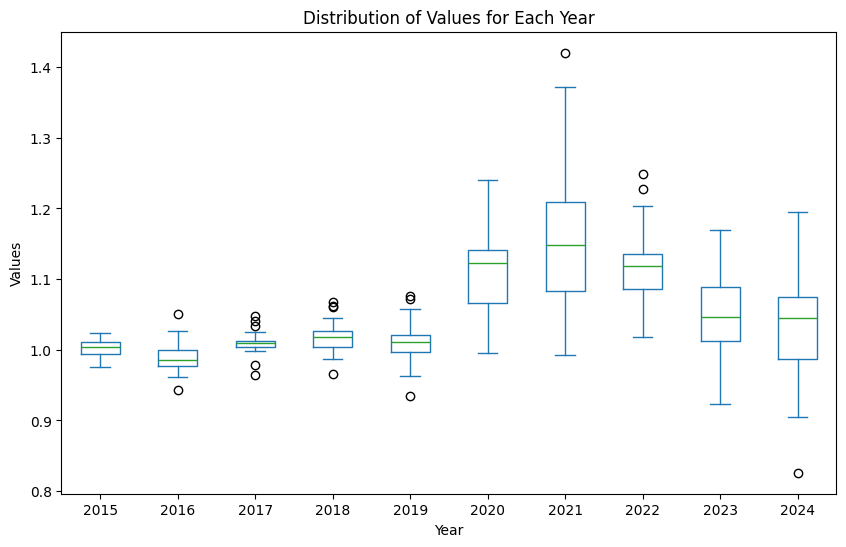

In [94]:
# Plot the distribution of each year without dropping the "baseline" column
temp = ds3.copy()
# temp = pd.concat([temp.head(5),temp.tail(5)])
temp.plot(kind='box', figsize=(10, 6))

# Add title and labels
plt.title('Distribution of Values for Each Year')
plt.ylabel('Values')
plt.xlabel('Year')

# Show the plot
plt.show()


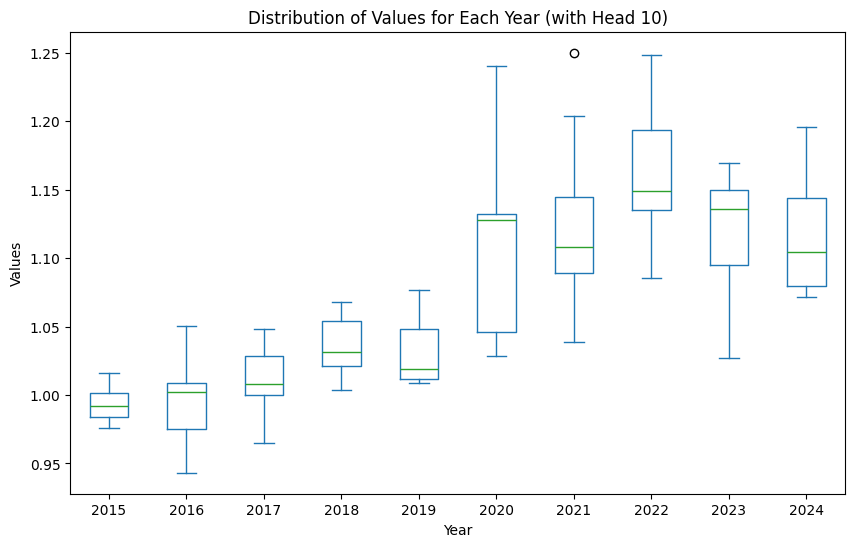

In [95]:
# Plot the distribution of each year without dropping the "baseline" column
temp = ds3.copy()
temp = temp.head(10)
temp.plot(kind='box', figsize=(10, 6))

# Add title and labels
plt.title('Distribution of Values for Each Year (with Head 10)')
plt.ylabel('Values')
plt.xlabel('Year')

# Show the plot
plt.show()

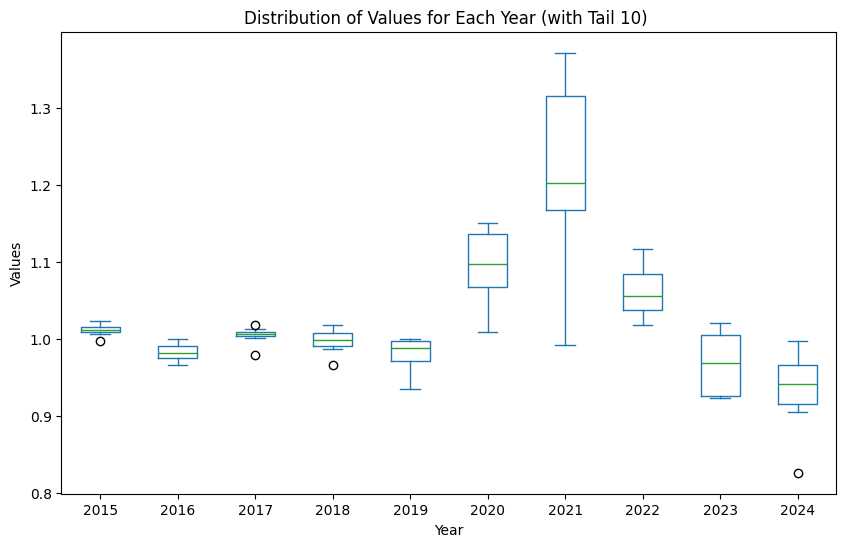

In [96]:
# Plot the distribution of each year without dropping the "baseline" column
temp = ds3.copy()
temp = temp.tail(10)
temp.plot(kind='box', figsize=(10, 6))

# Add title and labels
plt.title('Distribution of Values for Each Year (with Tail 10) ')
plt.ylabel('Values')
plt.xlabel('Year')

# Show the plot
plt.show()

### top 10 and bottom 10 of 2023

In [97]:

display(HTML('<h3>top 10 and bottom 10 of 2023</h3>'))
ds3 = ds3.sort_values(by=2023,ascending=False)
ds3 = ds3.reset_index(drop=True)
head_d_2023 = ds3.head(10)
tail_d_2023 = ds3.tail(10)
display(head_d_2023)
display(tail_d_2023)



index,abbr,name,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,MT,Malta,1.004184,0.961853,1.033963,1.067692,1.071181,1.184481,1.203770,1.227031,1.169460,1.195546
1,CY,Cyprus,1.016346,0.943262,1.040393,1.003860,1.076579,1.129651,1.249891,1.247986,1.157954,1.096045
2,FI,Finland,0.983743,1.009832,1.006425,1.023365,1.011018,1.038535,1.083747,1.163045,1.150604,1.071260
3,IS,Iceland,0.975565,1.026531,0.997904,1.006403,1.012217,1.029105,1.045764,1.203210,1.147299,1.163483
4,NL,Netherlands,0.990693,0.999474,1.009833,1.031156,1.021553,1.133244,1.147667,1.140754,1.138435,1.149158
5,IE,Ireland,0.994299,1.004803,1.000898,1.020068,1.008418,1.028275,1.105658,1.135253,1.132767,1.113119
6,DE,Germany,1.003718,0.985612,1.010670,1.035622,1.018740,1.068480,1.108212,1.157353,1.114044,1.077869
7,DK,Denmark,0.994748,0.997674,1.007578,1.045014,1.020898,1.032780,1.082298,1.124667,1.097724,1.065146
8,AT,Austria,1.010987,0.979174,1.009838,1.019178,1.012893,1.111234,1.112013,1.137336,1.088789,1.067498
9,LU,Luxembourg,0.979469,0.972163,1.048368,1.060452,1.057493,1.129244,1.107309,1.095965,1.088320,1.085966


index,abbr,name,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
23,SK,Slovakia,1.010289,0.979649,1.010062,1.018244,0.999022,1.112117,1.372355,1.116463,1.014783,0.997798
24,SE,Sweden,1.006546,0.991938,1.001516,1.001639,0.962678,1.065568,0.992139,1.018073,1.012203,0.966574
25,HU,Hungary,1.013660,0.973892,1.012448,1.007290,0.996887,1.083705,1.195663,1.048437,0.985096,0.965534
26,ME,Montenegro,0.986367,1.000973,1.012659,1.009543,1.025125,1.123652,1.420279,1.094931,0.983833,1.006333
27,HR,Croatia,1.023176,0.969357,1.007467,0.994095,0.976109,1.075151,1.184736,1.076914,0.968998,0.956600
28,LV,Latvia,0.997062,0.997681,1.005257,1.008204,0.969234,1.009589,1.209122,1.062046,0.968743,0.914891
29,BG,Bulgaria,1.011203,0.983878,1.004919,0.994670,0.991085,1.135620,1.366449,1.087036,0.925294,0.904618
30,LT,Lithuania,1.021293,0.999988,0.978720,0.965553,0.934519,1.064275,1.161615,1.037213,0.925170,0.917894
31,RO,Romania,1.007797,0.988060,1.004144,1.011851,1.000369,1.136852,1.284520,1.038633,0.924040,0.825981
32,RS,Serbia,1.011858,0.980546,1.007597,0.986798,0.985606,1.141033,1.326933,1.020004,0.923318,0.925503


## Dataset4 **ds4**

### Data Source
https://vaccinetracker.ecdc.europa.eu/public/extensions/Covid-19/vaccine-tracker.html#uptake-tab

### How to Download
https://www.ecdc.europa.eu/en/publications-data/data-covid-19-vaccination-eu-eea
* download the xlsx

### Description
The downloadable data file contains information on COVID-19 vaccination in the EU/EEA.

The data are presented in the Vaccine Tracker and collected through The European Surveillance System (TESSy). EU/EEA Member States are requested to report basic indicators (number of vaccine doses distributed by manufacturers, number of first, second, additional and unspecified doses administered) and data by target groups at national level every four weeks.

Data are subject to retrospective corrections. Corrected datasets are released every four weeks as soon as the processing of updated national data has been completed at ECDC level. You may use the data in line with ECDC’s copyright policy.

In [98]:
file = os.path.join(DIR,"data.csv")
ds4 = None
with open(file,'r',encoding='utf-8') as f:
    cols = f.readline().strip().split(',')
    ds4 = pd.read_csv(f, names=cols, skiprows=1, encoding='utf-8')

print(len(ds4), 'this should be 813,366')
display(ds4.head(10))
display(ds4.tail(10))


813366 this should be 813,366


,YearWeekISO,ReportingCountry,Denominator,NumberDosesReceived,NumberDosesExported,FirstDose,FirstDoseRefused,SecondDose,DoseAdditional1,DoseAdditional2,DoseAdditional3,DoseAdditional4,DoseAdditional5,UnknownDose,Region,TargetGroup,Vaccine,Population
0,2023-W19,AT,431785.0,0.0,0.0,0,NaN,0,0,0,0,0,0,0,AT,Age0_4,MODBA.1,8978929
1,2023-W19,AT,7427239.0,0.0,0.0,1,NaN,0,1,9,13,0,0,0,AT,ALL,MOD,8978929
2,2023-W19,AT,1551690.0,0.0,0.0,0,NaN,0,0,0,0,0,0,0,AT,Age<18,MOD,8978929
3,2023-W19,AT,524214.0,0.0,0.0,0,NaN,0,0,1,3,0,0,0,AT,Age80+,MOD,8978929
4,2023-W19,AT,741680.0,0.0,0.0,0,NaN,0,0,1,4,0,0,0,AT,Age70_79,MOD,8978929
5,2023-W19,AT,1086320.0,0.0,0.0,0,NaN,0,0,3,2,0,0,0,AT,Age60_69,MOD,8978929
6,2023-W19,AT,1392642.0,0.0,0.0,0,NaN,0,0,1,3,0,0,0,AT,Age50_59,MOD,8978929
7,2023-W19,AT,435176.0,0.0,0.0,0,NaN,0,0,0,0,0,0,0,AT,Age5_9,MOD,8978929
8,2023-W19,AT,3005708.0,0.0,0.0,0,NaN,0,1,3,1,0,0,0,AT,Age25_49,MOD,8978929
9,2023-W19,AT,676675.0,0.0,0.0,1,NaN,0,0,0,0,0,0,0,AT,Age18_24,MOD,8978929


,YearWeekISO,ReportingCountry,Denominator,NumberDosesReceived,NumberDosesExported,FirstDose,FirstDoseRefused,SecondDose,DoseAdditional1,DoseAdditional2,DoseAdditional3,DoseAdditional4,DoseAdditional5,UnknownDose,Region,TargetGroup,Vaccine,Population
813356,2021-W13,SK,422889.0,0.0,0.0,22535,NaN,1262,0,0,0,0,0,0,SK,Age70_79,COM,5459781
813357,2021-W13,SK,183656.0,0.0,0.0,3364,NaN,994,0,0,0,0,0,0,SK,Age80+,COM,5459781
813358,2021-W13,SK,NaN,0.0,0.0,2,NaN,0,0,0,0,0,0,0,SK,AgeUNK,COM,5459781
813359,2021-W13,SK,4402238.0,0.0,0.0,1,NaN,0,0,0,0,0,0,0,SK,ALL,JANSS,5459781
813360,2021-W13,SK,2030544.0,0.0,0.0,1,NaN,0,0,0,0,0,0,0,SK,Age25_49,JANSS,5459781
813361,2021-W13,SK,4402238.0,0.0,0.0,10398,NaN,716,0,0,0,0,0,0,SK,ALL,MOD,5459781
813362,2021-W13,SK,376278.0,0.0,0.0,58,NaN,34,0,0,0,0,0,0,SK,Age18_24,MOD,5459781
813363,2021-W13,SK,2030544.0,0.0,0.0,494,NaN,188,0,0,0,0,0,0,SK,Age25_49,MOD,5459781
813364,2021-W13,SK,702343.0,0.0,0.0,362,NaN,97,0,0,0,0,0,0,SK,Age50_59,MOD,5459781
813365,2021-W51,SK,293077.0,0.0,0.0,75,NaN,59,0,0,0,0,0,0,SK,Age5_9,COM,5459781


### Data Cleaning

In [99]:
# i only care about the total vaccines (not broken into Age group)
ds4 = ds4[ds4.TargetGroup == 'ALL']
ds4 =ds4.drop(columns=['TargetGroup'])


ds4 = pd.pivot_table(
    data = ds4,
    values = ['FirstDose','SecondDose','DoseAdditional1','DoseAdditional2','DoseAdditional3','DoseAdditional4','DoseAdditional5','UnknownDose'],
    index = ['ReportingCountry','YearWeekISO','Population'],
    aggfunc="sum"
    )
ds4 = ds4.reset_index()

# gets get the total doses given 
doseCol = ['FirstDose','SecondDose','DoseAdditional1','DoseAdditional2','DoseAdditional3','DoseAdditional4','DoseAdditional5','UnknownDose']
ds4['total_dose'] = ds4[doseCol].sum(axis=1)
ds4 = ds4.drop(columns=doseCol)

# lets get the doses as a percent of the population
ds4['dose_ratio'] = ds4['total_dose']/ds4['Population']
# ds4['dose_ratio'] = ds4['total_dose']

# normalize it between [0.0 and 1.0] (for each country)

ds4['dose_norm'] = 0.0

abbrs = ds4.ReportingCountry.drop_duplicates().to_list()
for ic,c in enumerate(abbrs):
    temp = ds4[ds4.ReportingCountry == c]
    ds4.loc[(ds4.ReportingCountry == c),'dose_norm'] =  \
        (temp['dose_ratio'] - temp['dose_ratio'].min()) / (temp['dose_ratio'].max() - temp['dose_ratio'].min())


# lets drop the columns we don't need anymore 
ds4 = ds4.drop(columns=['total_dose'])
ds4 = ds4.drop(columns=['Population'])
ds4 = ds4.drop(columns=['dose_ratio'])

display(ds4.head(10))



,ReportingCountry,YearWeekISO,dose_norm
0,AT,2020-W53,0.006694
1,AT,2021-W01,0.034717
2,AT,2021-W02,0.113853
3,AT,2021-W03,0.130758
4,AT,2021-W04,0.065469
5,AT,2021-W05,0.130952
6,AT,2021-W06,0.156712
7,AT,2021-W07,0.137965
8,AT,2021-W08,0.171117
9,AT,2021-W09,0.226595


In [100]:
# lets breakout that Year and Week

d = []
for i,r in ds4.iterrows():
    y = r['YearWeekISO'][0:4]
    w = r['YearWeekISO'][6:8]
    d.append(
            {
                'abbr': r.ReportingCountry,
                'name': abbr_to_name(r.ReportingCountry),
                'year': y,
                'week': w,
                'year.week': int(y) + int(w)/100,
                'year.p': int(y) + (int(w)/52),
                'dose_norm': r.dose_norm,
            }
        )
ds4 = pd.DataFrame(d)
ds4 = ds4.fillna(0.0)
ds4.year = pd.to_numeric(ds4.year)
ds4.week = pd.to_numeric(ds4.week)

In [101]:
abbr = 'AT'
temp = ds4[ds4.abbr == abbr].sort_values(by='dose_norm',ascending=False)
display(temp.head(10))
display(temp.tail(10))

,abbr,name,year,week,year.week,year.p,dose_norm
47,AT,Austria,2021,47,2021.47,2021.903846,1.000000
48,AT,Austria,2021,48,2021.48,2021.923077,0.949520
46,AT,Austria,2021,46,2021.46,2021.884615,0.884239
23,AT,Austria,2021,23,2021.23,2021.442308,0.836211
49,AT,Austria,2021,49,2021.49,2021.942308,0.832905
50,AT,Austria,2021,50,2021.50,2021.961538,0.824695
26,AT,Austria,2021,26,2021.26,2021.500000,0.790800
25,AT,Austria,2021,25,2021.25,2021.480769,0.789266
24,AT,Austria,2021,24,2021.24,2021.461538,0.773953
22,AT,Austria,2021,22,2021.22,2021.423077,0.771289


,abbr,name,year,week,year.week,year.p,dose_norm
119,AT,Austria,2023,15,2023.15,2023.288462,0.001412
123,AT,Austria,2023,19,2023.19,2023.365385,0.000883
122,AT,Austria,2023,18,2023.18,2023.346154,0.000852
125,AT,Austria,2023,21,2023.21,2023.403846,0.000667
124,AT,Austria,2023,20,2023.20,2023.384615,0.000369
126,AT,Austria,2023,22,2023.22,2023.423077,0.000314
128,AT,Austria,2023,24,2023.24,2023.461538,0.000260
127,AT,Austria,2023,23,2023.23,2023.442308,0.000183
129,AT,Austria,2023,25,2023.25,2023.480769,0.000020
130,AT,Austria,2023,26,2023.26,2023.500000,0.000000


### Examining ds4


In [102]:
display(HTML('<h4>Simple Line Chart</h4>'))
temp = pd.pivot_table(
    data = ds4,
    values = 'dose_norm',
    index = ['abbr','name','year'],
    aggfunc="mean"
)
temp = temp.reset_index()
# display(temp)

fig = px.line(temp,x='year',y='dose_norm',color='name',height=750)
fig.update_layout(template="plotly_dark")

pio.write_html(fig, file="ds4_00.html", auto_open=True)
display(FileLink("ds4_00.html"))

fig.show()

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds4_00.html

In [103]:
display(HTML('<h4>Simple Line Chart</h4>'))
temp = pd.pivot_table(
    data = ds4,
    values = 'dose_norm',
    index = ['abbr','name','year.p'],
    aggfunc="mean"
)
temp = temp.reset_index()
# display(temp)

fig = px.line(temp,x='year.p',y='dose_norm',color='name',height=750)
fig.update_layout(template="plotly_dark")

pio.write_html(fig, file="ds4_01.html", auto_open=True)
display(FileLink("ds4_01.html"))

fig.show()

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds4_01.html

In [104]:
temp = pd.pivot_table(
    data = ds4,
    values = 'dose_norm',
    index = ['abbr','name'],
    columns=['year'],
    aggfunc="mean"
)

temp = temp.reset_index()
temp.columns.name = 'index' 
temp = temp.fillna(0.0)
temp = temp.sort_values(by=2023,ascending=False)

display(temp.style.background_gradient(cmap=sns.color_palette('Spectral_r', as_cmap=True),axis=1))

index,abbr,name,2020,2021,2022,2023
14,IE,Ireland,0.004703,0.382604,0.093024,0.027472
15,IS,Iceland,0.103542,0.269668,0.045163,0.019844
11,FR,France,0.000305,0.425517,0.108047,0.013643
23,NO,Norway,0.002457,0.388907,0.100768,0.012838
9,ES,Spain,0.023982,0.393321,0.100186,0.009936
10,FI,Finland,0.006582,0.409127,0.161988,0.007501
25,PT,Portugal,0.016925,0.349388,0.138235,0.005931
0,AT,Austria,0.006694,0.404771,0.083629,0.005068
16,IT,Italy,0.015188,0.501596,0.160609,0.004522
27,SE,Sweden,0.006373,0.411449,0.149740,0.004475


In [105]:
temp = pd.pivot_table(
    data = ds4,
    values = 'dose_norm',
    index = ['abbr','name'],
    columns=['year.p'],
    aggfunc="mean"
)

temp = temp.reset_index()
temp.columns.name = 'index' 
temp = temp.fillna(0.0)
temp = temp.sort_values(by=2023,ascending=False)

display(temp.style.background_gradient(cmap=sns.color_palette('Spectral_r', as_cmap=True),axis=1))

### top 10 and bottom 10 of 2023

In [106]:
temp = pd.pivot_table(
    data = ds4,
    values = 'dose_norm',
    index = ['abbr','name'],
    columns=['year'],
    aggfunc="mean"
)


temp.columns.name = 'index' 
temp = temp.fillna(0.0)
temp = temp.sort_values(by=2023,ascending=False)
temp = temp.reset_index()

head_v_2023 = temp.head(10)
tail_v_2023 = temp.tail(10)

## tops and bottom compare

In [107]:

display(HTML('<h3>top 10 and bottom 10 of 2023</h3>'))

overlap = list(set(head_d_2023.abbr.to_list()) & set(head_v_2023.abbr.to_list()))
display(HTML('matches between the <b>top death countries</b> and <b>top vaccinated countries</b> (2023)'))
display(HTML(f'{len(overlap)} out of a perfect 10'))

overlap = list(set(tail_d_2023.abbr.to_list()) & set(tail_v_2023.abbr.to_list()))
display(HTML('matches between the <b>bottom death countries</b> and <b>bottom vaccinated countries</b> (2023)'))
display(HTML(f'{len(overlap)} out of a perfect 10'))

overlap = list(set(head_d_2023.abbr.to_list()) & set(tail_v_2023.abbr.to_list()))
display(HTML('matches between the <b>top death countries</b> and <b>bottom vaccinated countries</b> (2023)'))
display(HTML(f'{len(overlap)} out of a perfect 10'))

overlap = list(set(tail_d_2023.abbr.to_list()) & set(head_v_2023.abbr.to_list()))
display(HTML('matches between the <b>bottom death countries</b> and <b>top vaccinated countries</b> (2023)'))
display(HTML(f'{len(overlap)} out of a perfect 10'))




## Dataset5 **ds5**
now let's merge the data

ds3: 'death data based on year'
ds3p: 'death data based on year.p'

ds4: 'vaccine data based on year'
ds4p: 'vaccine data based on year.p'

In [108]:
t3 = ds3.copy()
t3['abbr2'] = t3['abbr'] + '_d' #append d for death
t3['type'] = 'deaths'
t3 = t3.melt(id_vars=["abbr", "name", "abbr2","type"], var_name="year", value_name="value")

t4 = pd.pivot_table(
    data = ds4,
    values = 'dose_norm',
    index = ['abbr','name'],
    columns=['year'],
    aggfunc="mean"
)
t4 = t4.reset_index()
t4.columns.name = 'index' 
t4 = t4.fillna(0)
t4['abbr2'] = t4['abbr'] + '_v' #append d for vaccine
t4['type'] = 'vaccine'
t4 = t4.melt(id_vars=["abbr", "name", "abbr2","type"], var_name="year", value_name="value")
t4['value'] += 1.0 # adding one... to match better on the graphs

ds5 = pd.concat([t3,t4])
display(ds5.head(10))
display(ds5.tail(10))



,abbr,name,abbr2,type,year,value
0,MT,Malta,MT_d,deaths,2015,1.004184
1,CY,Cyprus,CY_d,deaths,2015,1.016346
2,FI,Finland,FI_d,deaths,2015,0.983743
3,IS,Iceland,IS_d,deaths,2015,0.975565
4,NL,Netherlands,NL_d,deaths,2015,0.990693
5,IE,Ireland,IE_d,deaths,2015,0.994299
6,DE,Germany,DE_d,deaths,2015,1.003718
7,DK,Denmark,DK_d,deaths,2015,0.994748
8,AT,Austria,AT_d,deaths,2015,1.010987
9,LU,Luxembourg,LU_d,deaths,2015,0.979469


,abbr,name,abbr2,type,year,value
110,LV,Latvia,LV_v,vaccine,2023,1.001847
111,MT,Malta,MT_v,vaccine,2023,1.000868
112,NL,Netherlands,NL_v,vaccine,2023,1.002770
113,NO,Norway,NO_v,vaccine,2023,1.012838
114,PL,Poland,PL_v,vaccine,2023,1.001499
115,PT,Portugal,PT_v,vaccine,2023,1.005931
116,RO,Romania,RO_v,vaccine,2023,1.000423
117,SE,Sweden,SE_v,vaccine,2023,1.004475
118,SI,Slovenia,SI_v,vaccine,2023,1.000833
119,SK,Slovakia,SK_v,vaccine,2023,1.000705


In [109]:

t3 = ds3p.copy()
t3['abbr2'] = t3['abbr'] + '_d' #append d for death
t3['type'] = 'deaths'
t3 = t3.melt(id_vars=["abbr", "name","abbr2", "type"], var_name="year", value_name="value")

t4 = pd.pivot_table(
    data = ds4,
    values = 'dose_norm',
    index = ['abbr','name'],
    columns=['year.p'],
    aggfunc="mean"
)
t4 = t4.reset_index()
t4.columns.name = 'index' 
t4 = t4.fillna(0)
t4['abbr2'] = t4['abbr'] + '_v' #append d for vaccine
t4['type'] = 'vaccine'
t4 = t4.melt(id_vars=["abbr", "name","abbr2", "type"], var_name="year", value_name="value")
t4['value'] += 1.0 # adding one... to match better on the graphs

ds5p = pd.concat([t3,t4])
display(ds5p.head(10))
display(ds5p.tail(10))


,abbr,name,abbr2,type,year,value
0,MT,Malta,MT_d,deaths,2015.019231,1.284821
1,IS,Iceland,IS_d,deaths,2015.019231,1.138347
2,NL,Netherlands,NL_d,deaths,2015.019231,1.141773
3,LI,Liechtenstein,LI_d,deaths,2015.019231,2.463158
4,IE,Ireland,IE_d,deaths,2015.019231,1.059605
5,CY,Cyprus,CY_d,deaths,2015.019231,1.134414
6,LU,Luxembourg,LU_d,deaths,2015.019231,1.038632
7,DE,Germany,DE_d,deaths,2015.019231,1.058014
8,PT,Portugal,PT_d,deaths,2015.019231,1.339164
9,FI,Finland,FI_d,deaths,2015.019231,1.061018


,abbr,name,abbr2,type,year,value
4370,LV,Latvia,LV_v,vaccine,2023.75,1.000000
4371,MT,Malta,MT_v,vaccine,2023.75,1.000000
4372,NL,Netherlands,NL_v,vaccine,2023.75,1.000047
4373,NO,Norway,NO_v,vaccine,2023.75,1.000000
4374,PL,Poland,PL_v,vaccine,2023.75,1.000140
4375,PT,Portugal,PT_v,vaccine,2023.75,1.061762
4376,RO,Romania,RO_v,vaccine,2023.75,1.000149
4377,SE,Sweden,SE_v,vaccine,2023.75,1.000154
4378,SI,Slovenia,SI_v,vaccine,2023.75,1.000000
4379,SK,Slovakia,SK_v,vaccine,2023.75,1.001667


### Examining ds5

In [110]:
display(HTML('<h4>Simple Line Chart</h4>'))
ds5 = ds5.sort_values(by=['abbr2','year'])
fig = px.line(ds5,x='year',y='value',color='abbr2',height=750)
fig.update_layout(template="plotly_dark")

pio.write_html(fig, file="ds5.html", auto_open=True)
display(FileLink("ds5.html"))

fig.show()

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds5.html

In [111]:
display(HTML('<h4>Simple Line Chart</h4>'))
ds5p = ds5p.sort_values(by=['abbr2','year'])
fig = px.line(ds5p,x='year',y='value',color='abbr2',height=750)
fig.update_layout(template="plotly_dark")

fig.add_shape(
    type="line",
    x0=2016, x1=2024,
    y0=1, y1=1, # Start and end y-coordinates
    line=dict(color="Red", width=2, dash="dash"),  # Line style
    xref="x", yref="y"          # Reference axes
)

pio.write_html(fig, file="ds5p.html", auto_open=True)
display(FileLink("ds5p.html"))

fig.show()

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds5p.html

In [112]:

# temp = pd.pivot_table(
#     data = ds5,
#     values = 'value',
#     index = ['abbr','name','type'],
#     columns=['year'],
#     aggfunc="mean"
# )
# temp = temp.drop(columns=['baseline'])
# temp = temp.reset_index()
# abbrs = temp.abbr.drop_duplicates().to_list()
# for ic,c in enumerate(abbrs):
#     t = temp[temp.abbr == c]
#     display(t.style.background_gradient(cmap=sns.color_palette('Spectral_r', as_cmap=True),axis=1))

In [113]:
# temp = pd.pivot_table(
#     data = ds5p,
#     values = 'value',
#     index = ['abbr','name','type'],
#     columns=['year'],
#     aggfunc="mean"
# )
# temp = temp.drop(columns=['baseline'])
# temp = temp.reset_index()
# abbrs = temp.abbr.drop_duplicates().to_list()
# for ic,c in enumerate(abbrs):
#     t = temp[temp.abbr == c]
#     display(t.style.background_gradient(cmap=sns.color_palette('Spectral_r', as_cmap=True),axis=1))

In [114]:
temp = ds5.copy()
temp.year = pd.to_numeric(temp.year)

temp = temp[(temp.year >= 2020) & (temp.year <= 2023)]
# temp = temp[(temp.year >= 2023)]

temp = pd.pivot_table(
    data = temp,
    values = 'value',
    index = ['abbr','name','year'],
    columns=['type'],
    aggfunc="mean"
)
temp = temp.reset_index()
# display(temp.head(10))

# Create a scatter plot
fig = px.scatter(
    temp,
    x="vaccine",      
    y="deaths",       
    color="name",     
    size="year",      
    hover_name="name",
    title="Scatter Plot: Vaccine Rates vs Death Rates by Country and Year (2020 - 2023)",
    labels={"vaccine": "Vaccine Rate", "deaths": "Death Rate"},
    height=750
)
fig.update_layout(template="plotly_dark")

fig.add_shape(
    type="line",
    x0=min(temp["vaccine"]), x1=max(temp["vaccine"]),                 # Start and end x-coordinates
    y0=1, y1=1, # Start and end y-coordinates
    line=dict(color="Red", width=2, dash="dash"),  # Line style
    xref="x", yref="y"          # Reference axes
)

pio.write_html(fig, file="ds5_00.html", auto_open=True)
display(FileLink("ds5_00.html"))

fig.show()

for y in range(2020,2024):
    temp2 = temp[(temp.year == y)]

    # Create a scatter plot
    fig = px.scatter(
        temp2,
        x="vaccine",      
        y="deaths",       
        color="name",     
        size="year",      
        hover_name="name",
        title=f"Scatter Plot: Vaccine Rates vs Death Rates by Country and Year ({y})",
        labels={"vaccine": "Vaccine Rate", "deaths": "Death Rate"},
        height=750
    )
    fig.update_layout(template="plotly_dark")


    fig.add_shape(
        type="line",
        x0=min(temp2["vaccine"]), x1=max(temp2["vaccine"]),                 # Start and end x-coordinates
        y0=1, y1=1, # Start and end y-coordinates
        line=dict(color="Red", width=2, dash="dash"),  # Line style
        xref="x", yref="y"          # Reference axes
    )

    pio.write_html(fig, file=f"ds5_00_{y}.html", auto_open=True)
    display(FileLink(f"ds5_00_{y}.html"))

    # Show the plot
    fig.show()



c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds5_00.html

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds5_00_2020.html

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds5_00_2021.html

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds5_00_2022.html

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds5_00_2023.html

In [115]:
temp = ds5p.copy()
temp = temp[(temp.year >= 2020.00) & (temp.year <= 2023.999)]

temp = pd.pivot_table(
    data = temp,
    values = 'value',
    index = ['abbr','name','year'],
    columns=['type'],
    aggfunc="mean"
)
temp = temp.reset_index()
# display(temp.head(10))

# Create a scatter plot
fig = px.scatter(
    temp,
    x="vaccine",      
    y="deaths",       
    color="name",     
    size="year",      
    hover_name="name",
    title="Scatter Plot: Vaccine Rates vs Death Rates by Country and Year (2020 - 2023)",
    labels={"vaccine": "Vaccine Rate", "deaths": "Death Rate"},
    height=750
)
fig.update_layout(template="plotly_dark")

pio.write_html(fig, file="ds5p_00.html", auto_open=True)
display(FileLink("ds5p_00.html"))

fig.show()

for y in range(2020,2024):
    temp2 = temp[(temp.year == y)]

    # Create a scatter plot
    fig = px.scatter(
        temp2,
        x="vaccine",      
        y="deaths",       
        color="name",     
        size="year",      
        hover_name="name",
        title=f"Scatter Plot: Vaccine Rates vs Death Rates by Country and Year ({y})",
        labels={"vaccine": "Vaccine Rate", "deaths": "Death Rate"},
        height=750
    )
    fig.update_layout(template="plotly_dark")


    fig.add_shape(
        type="line",
        x0=min(temp2["vaccine"]), x1=max(temp2["vaccine"]),                 # Start and end x-coordinates
        y0=1, y1=1, # Start and end y-coordinates
        line=dict(color="Red", width=2, dash="dash"),  # Line style
        xref="x", yref="y"          # Reference axes
    )

    pio.write_html(fig, file=f"ds5p_00_{y}.html", auto_open=True)
    display(FileLink(f"ds5p_00_{y}.html"))

    fig.show()

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds5p_00.html

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds5p_00_2020.html

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds5p_00_2021.html

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds5p_00_2022.html

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds5p_00_2023.html

<Axes: xlabel='vaccine', ylabel='deaths'>

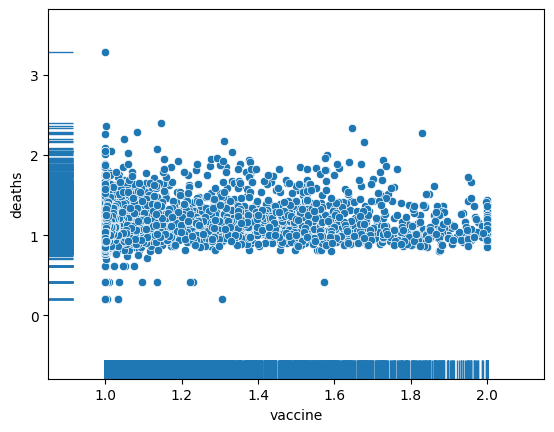

In [116]:

temp = ds5p.copy()
temp = temp[(temp.year >= 2020.00) & (temp.year <= 2023.999)]

temp = pd.pivot_table(
    data = temp,
    values = 'value',
    index = ['abbr','name','year'],
    columns=['type'],
    aggfunc="sum"
)
temp = temp.reset_index()

sns.scatterplot(data=temp, x="vaccine", y="deaths")
sns.rugplot(data=temp, x="vaccine", y="deaths", height=.05)


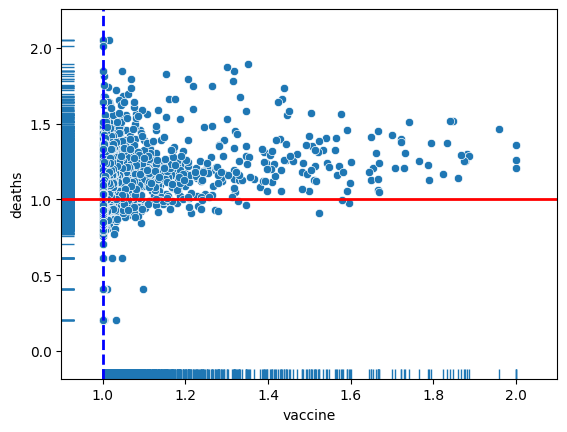

In [117]:

temp = ds5p.copy()
temp = temp[(temp.year >= 2022.00) & (temp.year <= 2023.999)]

temp = pd.pivot_table(
    data = temp,
    values = 'value',
    index = ['abbr','name','year'],
    columns=['type'],
    aggfunc="sum"
)
temp = temp.reset_index()
  

sns.scatterplot(data=temp, x="vaccine", y="deaths")
sns.rugplot(data=temp, x="vaccine", y="deaths") 

# Add vertical and horizontal lines
plt.axvline(x=1.0, color='blue', linestyle='--', linewidth=2)  # Vertical line at x=20
plt.axhline(y=1.0, color='red', linestyle='-', linewidth=2)  # Horizontal line at y=3

# Show the plot
plt.show()


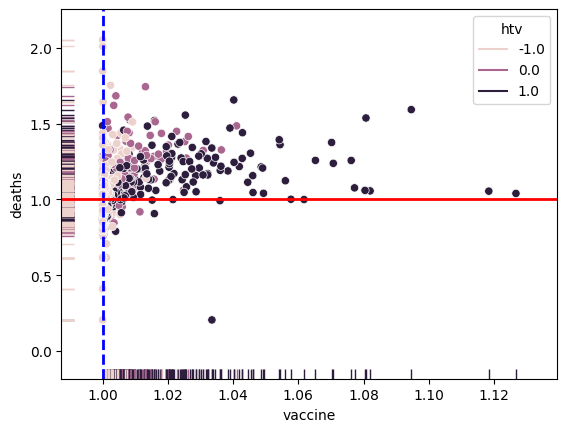

In [118]:
temp = ds5p.copy()
temp = temp[(temp.year >= 2023.00) & (temp.year <= 2023.999)]
temp['htv'] = 0.0
temp.loc[temp.abbr.isin(head_v_2023.abbr),'htv'] = 1.0
temp.loc[temp.abbr.isin(tail_v_2023.abbr),'htv'] = -1.0

# display(temp)

temp = pd.pivot_table(
    data = temp,
    values = 'value',
    index = ['abbr','name','year','htv'],
    columns=['type'],
    aggfunc="sum"
)
temp = temp.reset_index()

sns.scatterplot(data=temp, x="vaccine", y="deaths",hue='htv')
sns.rugplot(data=temp, x="vaccine", y="deaths",hue='htv')

# Add vertical and horizontal lines
plt.axvline(x=1.0, color='blue', linestyle='--', linewidth=2)  # Vertical line at x=20
plt.axhline(y=1.0, color='red', linestyle='-', linewidth=2)  # Horizontal line at y=3

# Show the plot
plt.show()


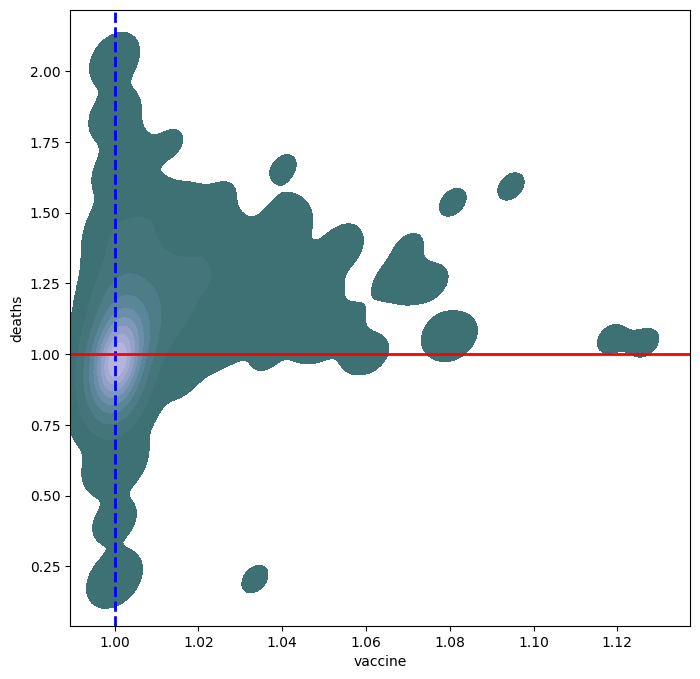

In [119]:
temp = ds5p.copy()
temp = temp[(temp.year >= 2023.00) & (temp.year <= 2023.999)]

temp = pd.pivot_table(
    data = temp,
    values = 'value',
    index = ['abbr','name','year'],
    columns=['type'],
    aggfunc="sum"
)
temp = temp.reset_index()
# Set up the figure
f, ax = plt.subplots(figsize=(8, 8))
# ax.set_aspect("equal")

cmap = sns.cubehelix_palette(start=2, rot=0.5, gamma=0.8, hue=0.7, dark=0.7, light=0.3, as_cmap=True)

# Draw a contour plot to represent each bivariate density
sns.kdeplot(
    data=temp,
    x="vaccine",
    y="deaths",
    thresh=0.01,
    cmap=cmap, fill=True,
)

# Add vertical and horizontal lines
plt.axvline(x=1.0, color='blue', linestyle='--', linewidth=2)  # Vertical line at x=20
plt.axhline(y=1.0, color='red', linestyle='-', linewidth=2)  # Horizontal line at y=3

# Show the plot
plt.show()

<Axes: xlabel='vaccine', ylabel='deaths'>

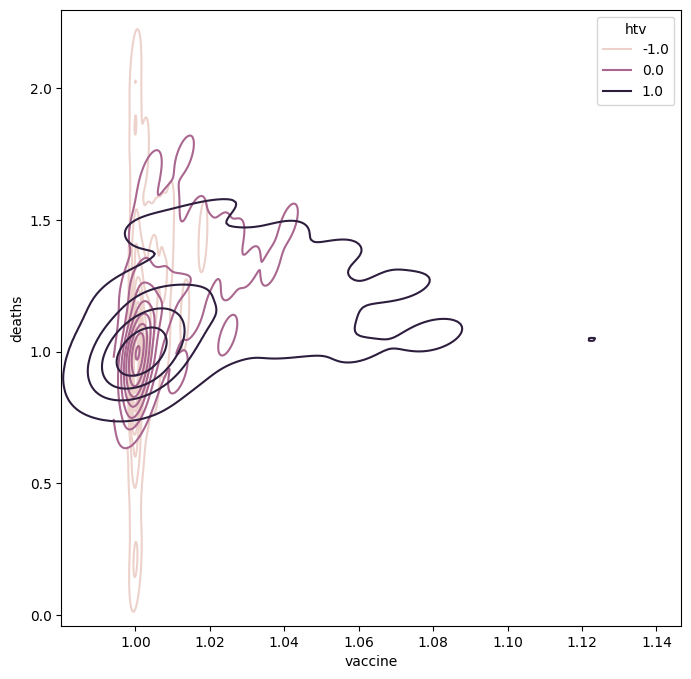

In [120]:
temp = ds5p.copy()
temp = temp[(temp.year >= 2023.00) & (temp.year <= 2023.999)]
temp['htv'] = 0.0
temp.loc[temp.abbr.isin(head_v_2023.abbr),'htv'] = 1.0
temp.loc[temp.abbr.isin(tail_v_2023.abbr),'htv'] = -1.0

temp = pd.pivot_table(
    data = temp,
    values = 'value',
    index = ['abbr','name','year','htv'],
    columns=['type'],
    aggfunc="sum"
)
temp = temp.reset_index()
# Set up the figure
f, ax = plt.subplots(figsize=(8, 8))
# ax.set_aspect("equal")

# Draw a contour plot to represent each bivariate density
sns.kdeplot(
    data=temp,
    x="vaccine",
    y="deaths",
    hue="htv",
    thresh=0.01,
)

<Axes: xlabel='vaccine', ylabel='deaths'>

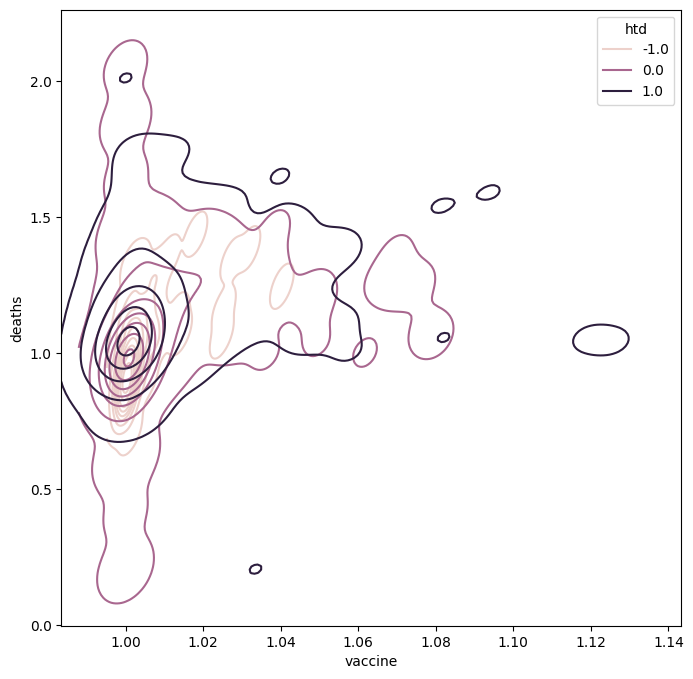

In [121]:
temp = ds5p.copy()
temp = temp[(temp.year >= 2023.00) & (temp.year <= 2023.999)]
temp['htd'] = 0.0
temp.loc[temp.abbr.isin(head_d_2023.abbr),'htd'] = 1.0
temp.loc[temp.abbr.isin(tail_d_2023.abbr),'htd'] = -1.0

temp = pd.pivot_table(
    data = temp,
    values = 'value',
    index = ['abbr','name','year','htd'],
    columns=['type'],
    aggfunc="sum"
)
temp = temp.reset_index()
# Set up the figure
f, ax = plt.subplots(figsize=(8, 8))
# ax.set_aspect("equal")

# cmap = sns.cubehelix_palette(start=2, rot=-0.5, gamma=0.8, hue=0.7, dark=0.8, light=0.0, as_cmap=True)

# Draw a contour plot to represent each bivariate density
sns.kdeplot(
    data=temp,
    x="vaccine",
    y="deaths",
    hue="htd",
    thresh=0.01,
    # cmap=cmap, fill=True,
)

<Axes: xlabel='vaccine', ylabel='deaths'>

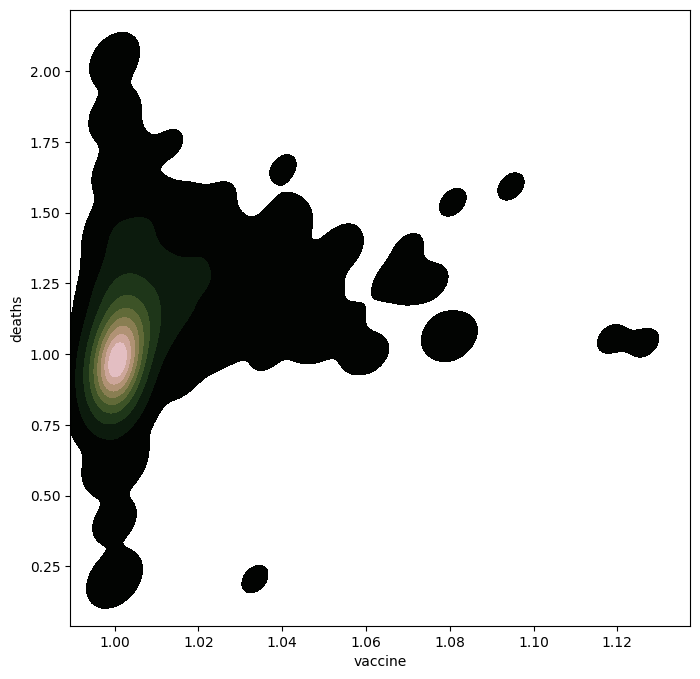

In [122]:
f, ax = plt.subplots(figsize=(8, 8))
# ax.set_aspect("equal")

cmap = sns.cubehelix_palette(start=2, rot=-0.5, gamma=0.8, hue=0.7, dark=0.8, light=0.0, as_cmap=True)

# Draw a contour plot to represent each bivariate density
sns.kdeplot(
    data=temp,
    x="vaccine",
    y="deaths",
    thresh=0.01,
    cmap=cmap, fill=True,
)

## Dataset6 **ds6**
i think, i need to think differently 🍎

lets download the data from ds4 again, 
but do a rolling sum, and compare the total vaxxed count with the deaths

### import 

In [123]:
file = os.path.join(DIR,"data.csv")
ds6 = None
with open(file,'r',encoding='utf-8') as f:
    cols = f.readline().strip().split(',')
    ds6 = pd.read_csv(f, names=cols, skiprows=1, encoding='utf-8')

print(len(ds6), 'this should be 813,366')
display(ds6.head(3))
display(ds6.tail(3))

813366 this should be 813,366


,YearWeekISO,ReportingCountry,Denominator,NumberDosesReceived,NumberDosesExported,FirstDose,FirstDoseRefused,SecondDose,DoseAdditional1,DoseAdditional2,DoseAdditional3,DoseAdditional4,DoseAdditional5,UnknownDose,Region,TargetGroup,Vaccine,Population
0,2023-W19,AT,431785.0,0.0,0.0,0,NaN,0,0,0,0,0,0,0,AT,Age0_4,MODBA.1,8978929
1,2023-W19,AT,7427239.0,0.0,0.0,1,NaN,0,1,9,13,0,0,0,AT,ALL,MOD,8978929
2,2023-W19,AT,1551690.0,0.0,0.0,0,NaN,0,0,0,0,0,0,0,AT,Age<18,MOD,8978929


,YearWeekISO,ReportingCountry,Denominator,NumberDosesReceived,NumberDosesExported,FirstDose,FirstDoseRefused,SecondDose,DoseAdditional1,DoseAdditional2,DoseAdditional3,DoseAdditional4,DoseAdditional5,UnknownDose,Region,TargetGroup,Vaccine,Population
813363,2021-W13,SK,2030544.0,0.0,0.0,494,NaN,188,0,0,0,0,0,0,SK,Age25_49,MOD,5459781
813364,2021-W13,SK,702343.0,0.0,0.0,362,NaN,97,0,0,0,0,0,0,SK,Age50_59,MOD,5459781
813365,2021-W51,SK,293077.0,0.0,0.0,75,NaN,59,0,0,0,0,0,0,SK,Age5_9,COM,5459781


### clean the data

In [124]:
# i only care about the total vaccines (not broken into Age group)
ds6 = ds6[ds6.TargetGroup == 'ALL']
ds6 =ds6.drop(columns=['TargetGroup'])


ds6 = pd.pivot_table(
    data = ds6,
    values = ['FirstDose','SecondDose','DoseAdditional1','DoseAdditional2','DoseAdditional3','DoseAdditional4','DoseAdditional5','UnknownDose'],
    index = ['ReportingCountry','YearWeekISO','Population'],
    aggfunc="sum"
    )
ds6 = ds6.reset_index()

# # # gets get the total doses given 
doseCol = ['FirstDose','SecondDose','DoseAdditional1','DoseAdditional2','DoseAdditional3','DoseAdditional4','DoseAdditional5','UnknownDose']
ds6['total_dose'] = ds6[doseCol].sum(axis=1)
ds6 = ds6.drop(columns=doseCol)

# # # # lets get the doses as a percent of the population
ds6['dose_ratio'] = ds6['total_dose'] #/ds6['Population']
ds6['dose_ratio_rolling'] = ds6.groupby("ReportingCountry")["dose_ratio"].transform(lambda x: x.rolling(window=len(x), min_periods=1).sum())
ds6['dose_ratio_rolling'] /= ds6['Population']

# ds6['dose_norm'] = 0.0
# abbrs = ds6.ReportingCountry.drop_duplicates().to_list()
# for ic,c in enumerate(abbrs):
#     temp = ds6[ds6.ReportingCountry == c]
#     ds6.loc[(ds6.ReportingCountry == c),'dose_norm'] =  \
#         (temp['dose_ratio_rolling'] - temp['dose_ratio_rolling'].min()) / (temp['dose_ratio_rolling'].max() - temp['dose_ratio_rolling'].min())
ds6['dose_norm'] = (ds6['dose_ratio_rolling'] - ds6['dose_ratio_rolling'].min()) / (ds6['dose_ratio_rolling'].max() - ds6['dose_ratio_rolling'].min())


ds6 = ds6.drop(columns=['total_dose'])
ds6 = ds6.drop(columns=['Population'])
ds6 = ds6.drop(columns=['dose_ratio_rolling'])
ds6 = ds6.drop(columns=['dose_ratio'])


display(ds6.head(10))
display(ds6.tail(10))




,ReportingCountry,YearWeekISO,dose_norm
0,AT,2020-W53,0.000086
1,AT,2021-W01,0.000508
2,AT,2021-W02,0.001882
3,AT,2021-W03,0.003458
4,AT,2021-W04,0.004250
5,AT,2021-W05,0.005829
6,AT,2021-W06,0.007717
7,AT,2021-W07,0.009380
8,AT,2021-W08,0.011442
9,AT,2021-W09,0.014170


,ReportingCountry,YearWeekISO,dose_norm
4253,SK,2023-W29,0.182974
4254,SK,2023-W30,0.182974
4255,SK,2023-W32,0.182974
4256,SK,2023-W33,0.182974
4257,SK,2023-W34,0.182974
4258,SK,2023-W35,0.182974
4259,SK,2023-W36,0.182974
4260,SK,2023-W37,0.182974
4261,SK,2023-W38,0.182975
4262,SK,2023-W39,0.182986


In [125]:
# lets breakout that Year and Week

d = []
for i,r in ds6.iterrows():
    y = r['YearWeekISO'][0:4]
    w = r['YearWeekISO'][6:8]
    d.append(
            {
                'abbr': r.ReportingCountry,
                'name': abbr_to_name(r.ReportingCountry),
                'year': y,
                'week': w,
                'year.week': int(y) + int(w)/100,
                'year.p': int(y) + (int(w)/52),
                'dose_norm': r.dose_norm,
            }
        )
ds6 = pd.DataFrame(d)
ds6 = ds6.fillna(0.0)
ds6.year = pd.to_numeric(ds6.year)
ds6.week = pd.to_numeric(ds6.week)

In [126]:
display(ds6.head(10))
display(ds6.tail(10))

,abbr,name,year,week,year.week,year.p,dose_norm
0,AT,Austria,2020,53,2020.53,2021.019231,0.000086
1,AT,Austria,2021,1,2021.01,2021.019231,0.000508
2,AT,Austria,2021,2,2021.02,2021.038462,0.001882
3,AT,Austria,2021,3,2021.03,2021.057692,0.003458
4,AT,Austria,2021,4,2021.04,2021.076923,0.004250
5,AT,Austria,2021,5,2021.05,2021.096154,0.005829
6,AT,Austria,2021,6,2021.06,2021.115385,0.007717
7,AT,Austria,2021,7,2021.07,2021.134615,0.009380
8,AT,Austria,2021,8,2021.08,2021.153846,0.011442
9,AT,Austria,2021,9,2021.09,2021.173077,0.014170


,abbr,name,year,week,year.week,year.p,dose_norm
4253,SK,Slovakia,2023,29,2023.29,2023.557692,0.182974
4254,SK,Slovakia,2023,30,2023.30,2023.576923,0.182974
4255,SK,Slovakia,2023,32,2023.32,2023.615385,0.182974
4256,SK,Slovakia,2023,33,2023.33,2023.634615,0.182974
4257,SK,Slovakia,2023,34,2023.34,2023.653846,0.182974
4258,SK,Slovakia,2023,35,2023.35,2023.673077,0.182974
4259,SK,Slovakia,2023,36,2023.36,2023.692308,0.182974
4260,SK,Slovakia,2023,37,2023.37,2023.711538,0.182974
4261,SK,Slovakia,2023,38,2023.38,2023.730769,0.182975
4262,SK,Slovakia,2023,39,2023.39,2023.750000,0.182986


## Dataset7 **ds7**
let's combine it with the death data

In [127]:
t3 = ds3.copy()
t3['abbr2'] = t3['abbr'] + '_d' #append d for death
t3['type'] = 'deaths'
t3 = t3.melt(id_vars=["abbr", "name", "abbr2","type"], var_name="year", value_name="value")

t4 = pd.pivot_table(
    data = ds6,
    values = 'dose_norm',
    index = ['abbr','name'],
    columns=['year'],
    aggfunc="max"
)
t4 = t4.reset_index()
t4.columns.name = 'index' 
t4 = t4.fillna(0)
t4['abbr2'] = t4['abbr'] + '_v' #append d for vaccine
t4['type'] = 'vaccine'
t4 = t4.melt(id_vars=["abbr", "name", "abbr2","type"], var_name="year", value_name="value")

ds7 = pd.concat([t3,t4])
display(ds7.head(10))
display(ds7.tail(10))

,abbr,name,abbr2,type,year,value
0,MT,Malta,MT_d,deaths,2015,1.004184
1,CY,Cyprus,CY_d,deaths,2015,1.016346
2,FI,Finland,FI_d,deaths,2015,0.983743
3,IS,Iceland,IS_d,deaths,2015,0.975565
4,NL,Netherlands,NL_d,deaths,2015,0.990693
5,IE,Ireland,IE_d,deaths,2015,0.994299
6,DE,Germany,DE_d,deaths,2015,1.003718
7,DK,Denmark,DK_d,deaths,2015,0.994748
8,AT,Austria,AT_d,deaths,2015,1.010987
9,LU,Luxembourg,LU_d,deaths,2015,0.979469


,abbr,name,abbr2,type,year,value
110,LV,Latvia,LV_v,vaccine,2023,0.214941
111,MT,Malta,MT_v,vaccine,2023,0.332036
112,NL,Netherlands,NL_v,vaccine,2023,0.313930
113,NO,Norway,NO_v,vaccine,2023,0.316378
114,PL,Poland,PL_v,vaccine,2023,0.409321
115,PT,Portugal,PT_v,vaccine,2023,0.757105
116,RO,Romania,RO_v,vaccine,2023,0.116894
117,SE,Sweden,SE_v,vaccine,2023,0.620044
118,SI,Slovenia,SI_v,vaccine,2023,0.197271
119,SK,Slovakia,SK_v,vaccine,2023,0.182986


In [128]:
t3 = ds3p.copy()
t3['abbr2'] = t3['abbr'] + '_d' #append d for death
t3['type'] = 'deaths'
t3 = t3.melt(id_vars=["abbr", "name", "abbr2","type"], var_name="year", value_name="value")

t4 = pd.pivot_table(
    data = ds6,
    values = 'dose_norm',
    index = ['abbr','name'],
    columns=['year.p'],
    aggfunc="max"
)
t4 = t4.reset_index()
t4.columns.name = 'index' 
t4 = t4.fillna(0)
t4['abbr2'] = t4['abbr'] + '_v' #append d for vaccine
t4['type'] = 'vaccine'
t4 = t4.melt(id_vars=["abbr", "name", "abbr2","type"], var_name="year", value_name="value")

ds7p = pd.concat([t3,t4])
display(ds7p.head(10))
display(ds7p.tail(10))

,abbr,name,abbr2,type,year,value
0,MT,Malta,MT_d,deaths,2015.019231,1.284821
1,IS,Iceland,IS_d,deaths,2015.019231,1.138347
2,NL,Netherlands,NL_d,deaths,2015.019231,1.141773
3,LI,Liechtenstein,LI_d,deaths,2015.019231,2.463158
4,IE,Ireland,IE_d,deaths,2015.019231,1.059605
5,CY,Cyprus,CY_d,deaths,2015.019231,1.134414
6,LU,Luxembourg,LU_d,deaths,2015.019231,1.038632
7,DE,Germany,DE_d,deaths,2015.019231,1.058014
8,PT,Portugal,PT_d,deaths,2015.019231,1.339164
9,FI,Finland,FI_d,deaths,2015.019231,1.061018


,abbr,name,abbr2,type,year,value
4370,LV,Latvia,LV_v,vaccine,2023.75,0.000000
4371,MT,Malta,MT_v,vaccine,2023.75,0.000000
4372,NL,Netherlands,NL_v,vaccine,2023.75,0.313930
4373,NO,Norway,NO_v,vaccine,2023.75,0.000000
4374,PL,Poland,PL_v,vaccine,2023.75,0.409321
4375,PT,Portugal,PT_v,vaccine,2023.75,0.757105
4376,RO,Romania,RO_v,vaccine,2023.75,0.116894
4377,SE,Sweden,SE_v,vaccine,2023.75,0.620044
4378,SI,Slovenia,SI_v,vaccine,2023.75,0.197271
4379,SK,Slovakia,SK_v,vaccine,2023.75,0.182986


### Examining ds7

In [129]:
display(HTML('<h4>Simple Line Chart</h4>'))
ds7 = ds7.sort_values(by=['abbr2','year'])
fig = px.line(ds7,x='year',y='value',color='abbr2',height=750)
fig.update_layout(template="plotly_dark")

pio.write_html(fig, file="ds7.html", auto_open=True)
display(FileLink("ds7.html"))

fig.show()

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds7.html

In [130]:
display(HTML('<h4>Simple Line Chart</h4>'))
ds7p = ds7p.sort_values(by=['abbr2','year'])
fig = px.line(ds7p,x='year',y='value',color='abbr2',height=750)
fig.update_layout(template="plotly_dark")

pio.write_html(fig, file="ds7p.html", auto_open=True)
display(FileLink("ds7p.html"))

fig.show()

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds7p.html

In [131]:
temp = ds7.copy()
temp.year = pd.to_numeric(temp.year)

temp = temp[(temp.year >= 2020) & (temp.year <= 2023)]
# temp = temp[(temp.year >= 2023)]

temp = pd.pivot_table(
    data = temp,
    values = 'value',
    index = ['abbr','name','year'],
    columns=['type'],
    aggfunc="mean"
)
temp = temp.reset_index()
# display(temp.head(10))

# Create a scatter plot
fig = px.scatter(
    temp,
    x="vaccine",      
    y="deaths",       
    color="name",     
    size="year",      
    hover_name="name",
    title="Scatter Plot: Vaccine Rates vs Death Rates by Country and Year (2020 - 2023)",
    labels={"vaccine": "Vaccine Rate", "deaths": "Death Rate"},
    height=750
)
fig.update_layout(template="plotly_dark")

fig.add_shape(
    type="line",
    x0=min(temp["vaccine"]), x1=max(temp["vaccine"]),                 # Start and end x-coordinates
    y0=1, y1=1, # Start and end y-coordinates
    line=dict(color="Red", width=2, dash="dash"),  # Line style
    xref="x", yref="y"          # Reference axes
)

pio.write_html(fig, file="ds7_00_.html", auto_open=True)
display(FileLink("ds7_00_.html"))

fig.show()

for y in range(2020,2024):
    temp2 = temp[(temp.year == y)]

    # Create a scatter plot
    fig = px.scatter(
        temp2,
        x="vaccine",      
        y="deaths",       
        color="name",     
        size="year",      
        hover_name="name",
        title=f"Scatter Plot: Vaccine Rates vs Death Rates by Country and Year ({y})",
        labels={"vaccine": "Vaccine Rate", "deaths": "Death Rate"},
        height=750
    )
    fig.update_layout(template="plotly_dark")


    fig.add_shape(
        type="line",
        x0=min(temp2["vaccine"]), x1=max(temp2["vaccine"]),                 # Start and end x-coordinates
        y0=1, y1=1, # Start and end y-coordinates
        line=dict(color="Red", width=2, dash="dash"),  # Line style
        xref="x", yref="y"          # Reference axes
    )

    pio.write_html(fig, file=f"ds7_00_{y}.html", auto_open=True)
    display(FileLink(f"ds7_00_{y}.html"))

    # Show the plot
    fig.show()

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds7_00_.html

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds7_00_2020.html

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds7_00_2021.html

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds7_00_2022.html

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds7_00_2023.html

In [132]:
temp = ds7p.copy()
temp.year = pd.to_numeric(temp.year)

temp = temp[(temp.year >= 2020.00) & (temp.year <= 2023.999)]
# temp = temp[(temp.year >= 2023)]

temp = pd.pivot_table(
    data = temp,
    values = 'value',
    index = ['abbr','name','year'],
    columns=['type'],
    aggfunc="mean"
)
temp = temp.reset_index()
# display(temp.head(10))

# Create a scatter plot
fig = px.scatter(
    temp,
    x="vaccine",      
    y="deaths",       
    color="name",     
    size="year",      
    hover_name="name",
    title="Scatter Plot: Vaccine Rates vs Death Rates by Country and Year (2020 - 2023)",
    labels={"vaccine": "Vaccine Rate", "deaths": "Death Rate"},
    height=750
)
fig.update_layout(template="plotly_dark")

fig.add_shape(
    type="line",
    x0=min(temp["vaccine"]), x1=max(temp["vaccine"]),                 # Start and end x-coordinates
    y0=1, y1=1, # Start and end y-coordinates
    line=dict(color="Red", width=2, dash="dash"),  # Line style
    xref="x", yref="y"          # Reference axes
)

pio.write_html(fig, file="dds7p_00_.html", auto_open=True)
display(FileLink("ds7p_00_.html"))

fig.show()

for y in range(2020,2024):
    temp2 = temp[(temp.year == y)]

    # Create a scatter plot
    fig = px.scatter(
        temp2,
        x="vaccine",      
        y="deaths",       
        color="name",     
        size="year",      
        hover_name="name",
        title=f"Scatter Plot: Vaccine Rates vs Death Rates by Country and Year ({y})",
        labels={"vaccine": "Vaccine Rate", "deaths": "Death Rate"},
        height=750
    )
    fig.update_layout(template="plotly_dark")


    fig.add_shape(
        type="line",
        x0=min(temp2["vaccine"]), x1=max(temp2["vaccine"]),                 # Start and end x-coordinates
        y0=1, y1=1, # Start and end y-coordinates
        line=dict(color="Red", width=2, dash="dash"),  # Line style
        xref="x", yref="y"          # Reference axes
    )

    pio.write_html(fig, file=f"ds7p_00_{y}.html", auto_open=True)
    display(FileLink(f"ds7p_00_{y}.html"))

    # Show the plot
    fig.show()

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds7p_00_.html

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds7p_00_2020.html

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds7p_00_2021.html

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds7p_00_2022.html

c:\Users\JGarza\GitHub\Excess_Mortality_And_Vaccines_In_Europe\ds7p_00_2023.html